# Python Machine Learning client for SAP HANA, release 2.23 enhancements sample notebook

The changelog of enhancements with the release version 2.23 can be found [in the documentation](https://help.sap.com/doc/cd94b08fe2e041c2ba778374572ddba9/2024_4_QRC/en-US/change_log.html), and are summaried below  <br><br>
__New functions__<br>
    - Outlier Detection for regression:  `hana_ml.algorithms.pal.preprocessing.OutlierDetectionRegression`.  <br>
    - Hierarchical DBSCAN:`~hana_ml.algorithms.pal.clustering.HDBSCAN`.  <br>
    - Text splitter: `hana_ml.text.text_splitter.TextSplitter`.  <br>
    - PAL embeddings: `hana_ml.text.pal_embeddings.PALEmbeddings`.  <br>
    - Embedding-based ANNS model: `hana_ml.text.anns_model.ANNSModel`.  <br>
    - Dataset card function: `hana_ml.algorithms.pal.dataset_cards.create_dataset_card`.  <br>
    - Dataframe create_remote_source function: `hana_ml.dataframe.create_remote_source`  <br>
<br>
__Enhancements__<br>
    - Provided two more options of 'RLinear' and 'RMLP' of `network_type` in: `~hana_ml.algorithms.pal.tsa.ltsf.LTSF`. <br>
    - Enhanced CAP generation for AdditiveModelForecast when disable_hana_execution is on. <br>
    - Enhanced AutoML time series for explainability. <br>
    - Enhanced pipeline report with parallel_coordinates chart. <br>
    - Integrated unified report with time series report. <br>
    - Enhanced Massive AutoML with progress monitor. <br>
<br>

## Connect to your SAP HANA Cloud instance

The latest Python ML client for SAP HANA package update is ready for installation and can be found at: https://pypi.org/project/hana-ml/

In [1]:
## Loading the Python Machine Learning client library for SAP HANA and get the version
import hana_ml
print(hana_ml.__version__)

2.23.240121700


Connect using the secure user connection store (hdbuserstore) and a connection key, see  [documentation](https://help.sap.com/docs/SAP_HANA_CLIENT/f1b440ded6144a54ada97ff95dac7adf/708e5fe0e44a4764a1b6b5ea549b88f4.html).  

In [2]:
# Create the SAP HANA CLoud connection
import hana_ml.dataframe as dataframe
#cc = dataframe.ConnectionContext( address="<hana-cloud-hostname>", port=443,  user="<HANA-user>")
#cc = dataframe.ConnectionContext( userkey=<your-key-name>, sslValidateCertificate=False)

# Utilize connection credentials from external file
from hana_ml.dataframe import ConnectionContext
from hana_ml.algorithms.pal.utility import Settings
url, port, user, pwd = Settings.load_config("../../config/e2edata.ini", "api")
#cc = ConnectionContext(url, port, user, pwd)
cc = ConnectionContext(userkey='<your key>')

# Control connection
print(cc.connection.isconnected())
print(cc.hana_version())

True
4.00.000.00.1733824539 (fa/CE2024.40)


## Data

### Using SQL ON FILES data for SAP HANA Cloud Machine Learning

As a introduction and reference point on how to setup SQL on Files with SAP HANA Cloud review the following blog post [Unlocking the True Potential of Data in Files with SAP HANA Database SQL on Files in SAP HANA Cloud](https://community.sap.com/t5/technology-blogs-by-sap/unlocking-the-true-potential-of-data-in-files-with-sap-hana-database-sql-on/ba-p/13861585), for linking SQL on Files with an existing SAP HANA Cloud instanct see the following learning yourney instructions [Adding a Standalone Data Lake to SAP HANA Cloud](https://learning.sap.com/learning-journeys/provision-and-administer-databases-in-sap-hana-cloud/adding-a-standalone-data-lake-to-sap-hana-cloud_adb39c82-3825-47fa-bdbd-1657210ba614).


In [ ]:
# Creating a remote source from Python
rs_endpoint = '<###...###.hanacloud.ondemand.com>'
conn.execute_sql('DROP REMOTE SOURCE MY_SOF_ENDPOINT CASCADE;') 
conn.create_remote_source(remote_source_name='MY_SOF_ENDPOINT',
                        adapter='file',        #adapter for communication between SAP HANA cloud and Data Lake files.
                        configuration=f'provider=hdlf;endpoint={rs_endpoint};',
                        credential_type='X509',
                        credential_string='PSE HANA_CLOUD_DATALAKE_PSE',    #please use a properly configurated PSE of your own
                        check_after_create=True)

In [ ]:
# Create a virtual table
table_structure = {"ID":"INTEGER", "X1": "INTEGER",
                   "X2":"INTEGER", "X3": "INTEGER",
                   "X4": "DOUBLE", "X5": "DOUBLE",
                   "X6": "INTEGER", "CLASS":"INTEGER"}

conn.create_virtual_table(table='MY_DIABETES_TBL', schema='PAL_TEST',
                          remote_source='MY_SOF_ENDPOINT',
                          data_lake_files='/files/csv/diabetes.csv',
                          table_structure=table_structure,
                          file_format='csv',
                          delimiter=',')

In [17]:
diabetes_data = conn.table('MY_DIABETES_TBL')

In [110]:
from hana_ml.algorithms.pal.trees import HybridGradientBoostingClassifier as HGC
hgc = HGC(n_estimators=10)
hgc.fit(data=diabetes_data, key='ID', label='CLASS')

In [112]:
fit_res = hgc.predict(data=diabetes_data.deselect('CLASS'),
                      key='ID')
print(fit_res.collect())

      ID SCORE  CONFIDENCE
0      0     1    0.742811
1      1     0    0.748175
2      2     0    0.673717
3      3     0    0.966890
4      4     1    0.633381
..   ...   ...         ...
763  763     0    0.550360
764  764     0    0.759844
765  765     0    0.861924
766  766     1    0.633621
767  767     0    0.924511

[768 rows x 3 columns]


### Unified Report - Integrated TimeSeries report 

In [ ]:
shampoo_data=conn.table('SHAMPOO_TBL')

100%|████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:03<00:00,  2.06it/s]



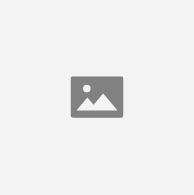

In [21]:
#### Integrated timeseries report into unified report
# if endog is used > time series report
from hana_ml.visualizers.unified_report import UnifiedReport

UnifiedReport(shampoo_data).build(key="ID", endog="SALES").display()

### Creating a Dataset Card

Dataset cards help users understand a dataset’s contents, the context for using the dataset, how it was created, and any other considerations a user should be aware of. For a detailed reference about the dataset card concept see [huggingface.co/dataset_card](https://huggingface.co/docs/datasets/en/dataset_card).

In [10]:
from hana_ml.algorithms.pal.dataset_cards import create_dataset_card

card = create_dataset_card(data=hdbscan_df_fit, key='ID',
                           language='en',
                           annotations_creators='found',
                           multilinguality='monolingual',
                           task_categories=['clustering'],
                           sorce_datasets='original',
                           pretty_name="hdbscan_test",
                           size_categories='unknown')   #overwrite the `size_categories` attribute

In [11]:
print(str(card))

---
annotations_creators: found
language: en
license: SAP Developer License Agreement
multilinguality: monolingual
size_categories: unknown
task_categories:
- clustering
pretty_name: hdbscan_test
select_statement: SELECT * FROM "HDBSCAN_DATA"
dtypes: '{''ID'': ''INT'', ''X'': ''REAL_VECTOR'', ''Y'': ''NVARCHAR''}'
name: DT_12
shape: '[30, 3]'
key: ID
sorce_datasets: original
---

# Dataset Card for hdbscan_test

<!-- Provide a quick summary of the dataset. -->



## Dataset Details

### Dataset Description

<!-- Provide a longer summary of what this dataset is. -->



- **Curated by:** [More Information Needed]
- **Funded by [optional]:** [More Information Needed]
- **Shared by [optional]:** [More Information Needed]
- **Language(s) (NLP):** en
- **License:** SAP Developer License Agreement

### Dataset Sources [optional]

<!-- Provide the basic links for the dataset. -->

- **Repository:** [More Information Needed]
- **Paper [optional]:** [More Information Needed]
- **Demo [optional]:

## AutoML enhancements
The SAP HANA Cloud Q3 2024 __Predictive Analysis Library (PAL)__ introduced new SQL functions for [data-parallel AutoML](https://help.sap.com/docs/hana-cloud-database/sap-hana-cloud-sap-hana-database-predictive-analysis-library/massive-interface-automl-massive-interface?locale=en-US) and [ML Pipeline](https://help.sap.com/docs/hana-cloud-database/sap-hana-cloud-sap-hana-database-predictive-analysis-library/massive-interface-automl-massive-interface?locale=en-US) modeling, also documented in the Python interface for [AutoML](https://help.sap.com/doc/cd94b08fe2e041c2ba778374572ddba9/2024_3_QRC/en-US/pal/algorithms.html#auto-ml) and [Pipeline](https://help.sap.com/doc/cd94b08fe2e041c2ba778374572ddba9/2024_3_QRC/en-US/pal/algorithms/hana_ml.algorithms.pal.pipeline.Pipeline.html) methods by applying the group_key-parameter to identify the data subgroups.

The Python ML client 2.23 now supports ProgressMonitor support for data-parallel, massive AutoML scenario execution.


### Data-parallel (massive) AutoML - ProgressMonitor Support
For a copy of the sample data see [github.com/SAP-samples/hana-ml-samples/.../shampoo_sales.csv](https://github.com/SAP-samples/hana-ml-samples/blob/main/Python-API/usecase-examples/usecase-example-datasets/shampoo_sales.csv)

In [3]:
# Use case dataset: 2 time series data for 2 different shampoo product sales over 3 years
# Upload a dataset from local CSV-file 
import pandas as pd
from hana_ml.dataframe import create_dataframe_from_pandas
shampoo_hdf = create_dataframe_from_pandas(cc,
                                            pd.read_csv("./shampoo_sales.csv", header=1, names=["MONTH", "PRODUCT", "PRODUCT_ID", "SALES"]),
                                            table_name="SHAMPOO_SALES",
                                            force=True,
                                            table_structure={"MONTH": "INTEGER", "PRODUCT": "NVARCHAR(32)", "PRODUCT_ID": "INTEGER", "SALES": "DOUBLE"})

print(shampoo_hdf.select_statement)
display(shampoo_hdf.sort("MONTH").head(5).collect())



100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 39.02it/s]

SELECT * FROM "SHAMPOO_SALES"


,MONTH,PRODUCT,PRODUCT_ID,SALES
0,1,Classic Shampoo,1,646.9
1,1,New Shampoo,2,266.0
2,2,New Shampoo,2,145.9
3,2,Classic Shampoo,1,581.3
4,3,Classic Shampoo,1,475.3


In [4]:
# Modeling time series for 'Classic Shampoo' and 'New Shampoo' in parallel

import uuid
from hana_ml.visualizers.automl_progress import PipelineProgressStatusMonitor
progress_indicator_id = "SegmentedAutoTS_{}".format(uuid.uuid1())

from hana_ml.algorithms.pal.massive_auto_ml import MassiveAutomaticTimeSeries
Segmented_AutoTS = MassiveAutomaticTimeSeries(
                              generations=3, population_size=15, offspring_size=10, 
                              early_stop=1, max_eval_time_mins=1, 
                              scorings={'RMSE': -1},
                              elite_number=3,
                              search_method='GA', connections='default'
                             ,config_dict='default',
                            #  special_group_id="Segmended_AutoTS_GroupID",
                              progress_indicator_id=progress_indicator_id)

Segmented_AutoTS.enable_workload_class(workload_class_name="AUTOML_WLC")
#Segmented_AutoTS.disable_workload_class(workload_class_name="AUTOML_WLC")


progress_status_monitor = PipelineProgressStatusMonitor(connection_context=cc, automatic_obj=Segmented_AutoTS)
progress_status_monitor.start()

Segmented_AutoTS.fit(data=shampoo_hdf.deselect("PRODUCT_ID"), 
                     group_key='PRODUCT',  
                     key='MONTH', endog="SALES",
                     group_pipelines=None,
                     model_table_name=None)

Segmented_AutoTS.runtime


<IPython.core.display.Javascript object>

9.430498838424683

In [5]:
# Inspect the elite pipelines from the best result dataframe
Segmented_AutoTS.best_pipeline_.collect().style.set_properties(**{'text-align': 'left'})


,PRODUCT,ID,PIPELINE,SCORES
0,New Shampoo,0,"{""BrownExpSm"":{""args"":{""ALPHA"":0.6},""inputs"":{""data"":""ROWDATA""}}}","{""EVAR"":0.020416443695038524,""LAYERS"":1.0,""MAE"":65.41929243382114,""MAPE"":0.2006464354696454,""MAX_ERROR"":140.9359227552395,""MSE"":6439.1574604080019,""R2"":-0.5124661166368025,""RMSE"":78.06587773540531,""SPEC"":74.54949056989564,""TIME"":0.0006000000000000001,""WMAPE"":0.20712778734979032}"
1,New Shampoo,1,"{""BrownExpSm"":{""args"":{""ALPHA"":0.3},""inputs"":{""data"":""ROWDATA""}}}","{""EVAR"":0.10609418078384767,""LAYERS"":1.0,""MAE"":65.66285269986797,""MAPE"":0.2047048572968147,""MAX_ERROR"":146.60191078661689,""MSE"":7283.220044103173,""R2"":-0.5536118018703038,""RMSE"":78.8335798352795,""SPEC"":92.6496582194289,""TIME"":0.0006000000000000001,""WMAPE"":0.21567747763888199}"
2,New Shampoo,2,"{""AutoExpSm"":{""args"":{""TREND_TEST_ALPHA"":0.05,""MODELSELECTION"":1,""MAX_ITERATION"":100,""SEASONALITY_CRITERION"":0.75,""GAMMA"":0.3,""BETA"":0.1,""ALPHA"":0.9,""PHI"":0.9},""inputs"":{""data"":""ROWDATA""}}}","{""EVAR"":0.028676191452000935,""LAYERS"":1.0,""MAE"":66.07491467028939,""MAPE"":0.18582890704262168,""MAX_ERROR"":144.76742328004759,""MSE"":7598.075808698626,""R2"":-0.5794608452525731,""RMSE"":81.50425147556422,""SPEC"":76.983141702444,""TIME"":0.0078,""WMAPE"":0.1989247490517204}"
3,Classic Shampoo,0,"{""ARIMA"":{""args"":{""SEASONALITY_CRITERION"":0.7,""SEASONAL_PERIOD"":-1,""INFORMATION_CRITERION"":2,""KPSS_SIGNIFICANCE_LEVEL"":0.1,""D"":-1,""MAX_SEASONAL_D"":2,""MAX_D"":4,""CH_SIGNIFICANCE_LEVEL"":0.05,""SEASONAL_D"":-1},""inputs"":{""data"":""ROWDATA""}}}","{""EVAR"":-0.29926976516220407,""LAYERS"":1.0,""MAE"":63.73727060079385,""MAPE"":0.2547413491411159,""MAX_ERROR"":130.4693324751849,""MSE"":7381.30000171781,""R2"":-1.2575237913220259,""RMSE"":75.48740509714422,""SPEC"":85.80277482909445,""TIME"":0.8029999999999999,""WMAPE"":0.26313758548472479}"
4,Classic Shampoo,1,"{""BSTS"":{""args"":{""BURN_IN"":0.1,""SEASONAL_PERIOD"":-1},""inputs"":{""data"":""ROWDATA""}}}","{""EVAR"":-0.261795301688446,""LAYERS"":1.0,""MAE"":68.26359547810299,""MAPE"":0.30175972140328097,""MAX_ERROR"":123.71540622555469,""MSE"":6540.175518216979,""R2"":-2.293241799086842,""RMSE"":78.33227152262472,""SPEC"":85.4014435575385,""TIME"":0.618,""WMAPE"":0.3004416466247307}"
5,Classic Shampoo,2,"{""BrownExpSm"":{""args"":{""ALPHA"":0.3},""inputs"":{""data"":""ROWDATA""}}}","{""EVAR"":0.1556566616249589,""LAYERS"":1.0,""MAE"":68.77041008920861,""MAPE"":0.2950186402739218,""MAX_ERROR"":130.73072659669598,""MSE"":7093.100570479462,""R2"":-2.147669324208079,""RMSE"":79.97480737868989,""SPEC"":101.90848505740213,""TIME"":0.0012000000000000002,""WMAPE"":0.2947204765516549}"


In [6]:
# Prepare a predict dataframe to calculate the forecast horizon for the next n periods, here next 10 months
predict_frame = Segmented_AutoTS.make_future_dataframe(periods=10)
display(predict_frame.sort("MONTH").head(5).collect())

,PRODUCT,MONTH
0,Classic Shampoo,36
1,Classic Shampoo,37
2,New Shampoo,37
3,New Shampoo,38
4,Classic Shampoo,38


In [7]:
# Forecast the Shampoo Product Sales for different products
predict_result = Segmented_AutoTS.predict(predict_frame, group_key='PRODUCT', key='MONTH')
predict_result.collect()

,PRODUCT,ID,SCORES
0,New Shampoo,37,676.6909053114418
1,New Shampoo,38,716.1055475810927
2,New Shampoo,39,755.5201898507435
3,New Shampoo,40,794.9348321203943
4,New Shampoo,41,834.3494743900451
5,New Shampoo,42,873.7641166596959
6,New Shampoo,43,913.1787589293467
7,New Shampoo,44,952.5934011989975
8,New Shampoo,45,992.0080434686483
9,New Shampoo,46,1031.4226857382992


In [ ]:
#print(cc.last_execute_statement)

### Enhanced AutoML time series for explainability.


In [15]:
from hana_ml.algorithms.pal.utility import DataSets
covid_data = DataSets.load_covid_data(cc)

Table PAL_COVID_DATA_TBL exists.


In [16]:
from hana_ml.algorithms.pal.partition import train_test_val_split

train_df, test_df, valid_df = train_test_val_split(data=covid_data,
                                                   training_percentage=0.7,
                                                   testing_percentage=0.2,
                                                   validation_percentage=0.1)

In [17]:
test_df.get_table_structure()

{'Date': 'NVARCHAR(5000)',
 'Confirmed': 'INT',
 'Recovered': 'INT',
 'Deaths': 'INT',
 'Increase rate': 'DOUBLE'}

In [18]:
test_df.head(10).collect()

,Date,Confirmed,Recovered,Deaths,Increase rate
0,1/23/2020,654,30,18,17.837838
1,2/1/2020,12038,284,259,21.265236
2,2/4/2020,23892,852,492,20.175041
3,2/5/2020,27635,1124,564,15.666332
4,2/6/2020,30794,1487,634,11.431156
5,2/12/2020,45221,5150,1118,0.935226
6,2/13/2020,60368,6295,1371,33.495500
7,2/16/2020,71224,10865,1770,3.178328
8,2/21/2020,76819,18890,2251,0.816305
9,2/24/2020,79561,25227,2629,0.763697


In [19]:
#### Explainable AutomaticTimeSeries

from hana_ml.algorithms.pal.auto_ml import AutomaticTimeSeries

auto_ts = AutomaticTimeSeries()
auto_ts.disable_workload_class_check()
auto_ts.fit(data=train_df.add_id("ID"), key='ID', endog='Increase rate', exog=['Confirmed', 'Recovered', 'Deaths'], use_explain=True, background_size=10)
result = auto_ts.predict(data=test_df.add_id("ID", starting_point=train_df.count()), key='ID', exog=['Confirmed', 'Recovered', 'Deaths'], show_explainer=True)

In [21]:
import pandas as pd
pd.set_option('max_colwidth', None) 
result.select('ID', 'SCORE', 'REASON_CODE').head(5).collect()

,ID,SCORE,REASON_CODE
0,84,1.906113985852837,"[{""attr"":""Confirmed"",""val"":0.0,""pct"":33.333333333333339},{""attr"":""Recovered"",""val"":0.0,""pct"":33.333333333333339},{""attr"":""Deaths"",""val"":0.0,""pct"":33.333333333333339}]"
1,85,1.8907330791913528,"[{""attr"":""Confirmed"",""val"":0.0,""pct"":33.333333333333339},{""attr"":""Recovered"",""val"":0.0,""pct"":33.333333333333339},{""attr"":""Deaths"",""val"":0.0,""pct"":33.333333333333339}]"
2,86,1.876890263196017,"[{""attr"":""Confirmed"",""val"":0.0,""pct"":33.333333333333339},{""attr"":""Recovered"",""val"":0.0,""pct"":33.333333333333339},{""attr"":""Deaths"",""val"":0.0,""pct"":33.333333333333339}]"
3,87,1.8644317288002146,"[{""attr"":""Confirmed"",""val"":0.0,""pct"":33.333333333333339},{""attr"":""Recovered"",""val"":0.0,""pct"":33.333333333333339},{""attr"":""Deaths"",""val"":0.0,""pct"":33.333333333333339}]"
4,88,1.8532190478439927,"[{""attr"":""Confirmed"",""val"":0.0,""pct"":33.333333333333339},{""attr"":""Recovered"",""val"":0.0,""pct"":33.333333333333339},{""attr"":""Deaths"",""val"":0.0,""pct"":33.333333333333339}]"


### Enhanced pipeline report with parallel_coordinates chart.


In [22]:
#### pipeline report with parallel_coordinates chart

from hana_ml.algorithms.pal.auto_ml import AutomaticClassification

auto_c = AutomaticClassification()
_, diabetes_train, diabetes_test, _ = DataSets.load_diabetes_data(cc)
auto_c.disable_workload_class_check()
auto_c.fit(data=diabetes_train, key='ID', label='CLASS')

Table PIMA_INDIANS_DIABETES_TBL exists.



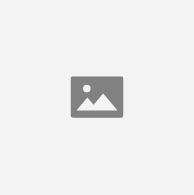

In [24]:
from hana_ml.visualizers.unified_report import UnifiedReport
UnifiedReport(auto_c).build().display()

### Outlier detection with AutoML Regression

The following blog post [Regression Outlier Detection within SAP HANA Cloud AutoML](https://community.sap.com/t5/technology-blogs-by-sap/regression-outlier-detection-in-sap-hana-and-embedded-in-automl-of-sap-hana/ba-p/13941638) describes the outlier regresstion detection approach for AutoML in detail. The implicit support with the Python ML client is planned for a future release.

## Artifact generation
### Improved CAP generation for AdditiveModelForecast

In [25]:
# Artifact generation for AdditiveModelForecast supported with disable_hana_execution-mode
from hana_ml.algorithms.pal.utility import DataSets
from hana_ml.algorithms.pal.tsa.additive_model_forecast import AdditiveModelForecast

shampoo_data = DataSets.load_shampoo_data(cc)



amf = AdditiveModelForecast(growth='linear')
amf.disable_hana_execution()
amf.fit(data=shampoo_data)
pred_data = amf.predict(data=amf.make_future_dataframe())

Table SHAMPOO_SALES_DATA_TBL exists.


In [26]:
from hana_ml.artifacts.generators.hana import HANAGeneratorForCAP

hanagen = HANAGeneratorForCAP(project_name="my_proj",
                              output_dir=".",
                              namespace="hana.ml")
hanagen.generate_artifacts(amf)



In [27]:
import os

os.listdir("my_proj")

['db', 'package.json', 'srv']

# Appendix